<a href="https://colab.research.google.com/github/Iskander80/ML/blob/master/08_%D0%9D%D0%BE%D1%83%D1%82%D0%B1%D1%83%D0%BA_08_boosting.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Recap. Ансамбли

**Ансамблевые методы** - парадигма машинного обучения, в которой несколько моделей обучаются для решения одной и той же проблемы и объединяются для получения лучших результатов. Основная гипотеза - при правильном сочетании слабых моделей мы можем получить более точные и/или надежные модели.

Вводится понятие **_слабых учеников_** (или **_базовых моделей_**). Часто базовые модели работают сами по себе не так хорошо в связи с тем, для этого есть две причины:
- имеют высокое смещение - например, модели с низкой степенью свободы
- имеют слишком большой разброс, чтобы быть устойчивыми (например, модели с высокой степенью свободы).

**Идея ансамблевых методов** - попытаться уменьшить смещение и/или разброс таких слабых учеников, объединяя несколько из них вместе, чтобы создать **_сильного ученика_** (или **_модель ансамбля_**), который достигает лучших результатов.

- **Bootstrap** - статистический метод, заключающийся в генерации выборок размера $B$ (так называемых бутстрэп-выборок) из исходного датасета размера $L$ путем случайного выбора элементов с повторениями в каждом из наблюдений $B$.
- **Бэггинг** (**bagging**, **bootstrap aggregation**) - один из основных методов ансамблирования. Основная идея - используем набор отдельных обучающих выборок $X^i$, полученных из исходной выборки $X$ с помощью бутстрапа, для обучения набора базовых моделей $b_i(x)=b(x, X^i)$, а затем создаем из них ансамбль $a(x)$:
$$a(x)=\frac{1}{k} \sum_{i=1}^k b_i(x)$$

$$\text{Random_Subspace_Method} (RSM) + Bagging = \text{Random Forest}$$


# Boosting

**Бустинг (boosting)** – это ансамблевый метод, в котором так же, как и в методах выше, строится множество базовых алгоритмов из одного семейства, объединяющихся затем в более сильную модель.

Отличие состоит в том, что в бэггинге и случайном лесе базовые алгоритмы учатся независимо и параллельно, а в бустинге – последовательно:

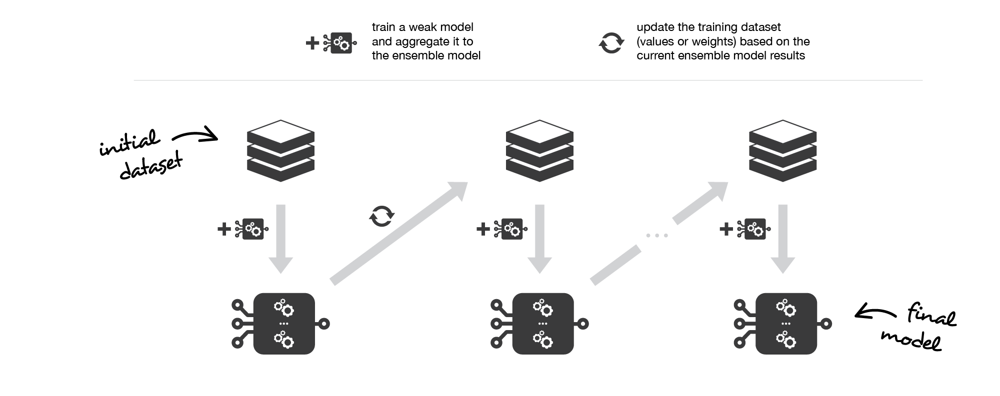

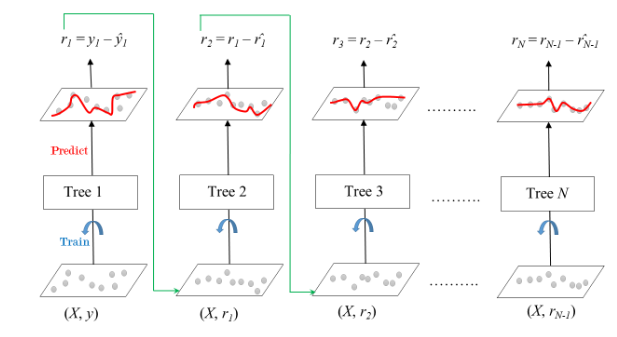

$$a(x)=\sum_{i=1}^k \rho_i b_i(x)$$

Каждый следующий базовый алгоритм в бустинге обучается так, чтобы уменьшить общую ошибку всех своих предшественников. Как следствие, итоговая композиция будет иметь меньшее смещение, чем каждый отдельный базовый алгоритм (хотя уменьшение разброса также может происходить).

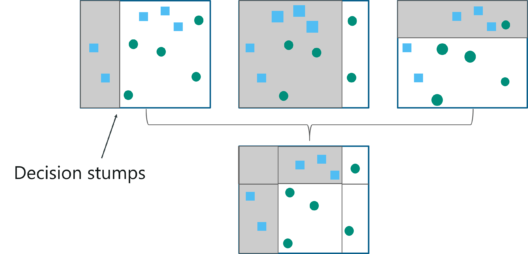

Поскольку **основная цель бустинга – уменьшение смещения**, в качестве базовых алгоритмов часто выбирают алгоритмы с высоким смещением и небольшим разбросом. Например, если в качестве базовых классификаторов выступают деревья, то их глубина должна быть небольшой – обычно не больше 2-3 уровней. Ещё важной причиной для выбора моделей с высоким смещением в качестве базовых является то, что такие модели, как правило, быстрее учатся - важно для их последовательного обучения.

Но как конкретно заставить новую модель исправлять ошибки старых?

# AdaBoost

**AdaBoost (Adaptive Boosting).**

**Идея** - взвешанная обучающая выборка, для каждого объекта для каждой модели добавляется вес (для функции потерь), зависящий от ошибки текущего ансамбля на этом объекте:

$$(X_i, y_i, w_i)$$

Предсказание ансамбля для задачи классификации:

$$a(x) = sign \left( \sum_{j=1}^K \alpha_j  a_j(x) \right)$$

Какие взять $\alpha_j$ и $w_i$?

## Обучение слабых классификаторов

Разберемся сначала с $\alpha_j$. Т.к. мы используем взвешанную функцию потерь, то ошибка одного слабого классификатора будет иметь вид:

$$ \varepsilon_j = \sum_i^N w_i^j \mathbb{I}[y_j(x_i) \neq y_i], $$

где $\mathbb{I}[y_j(x_i) \neq y_i]$ - индикаторная функция, возвращающая 1 при ошибке.

По сути мы просто суммируем веса тех примеров, на котором слабый классификатор допустил ошибку.

Если ошибка  $0.5 \leq \varepsilon_j$ , то слабый ученик чаще ошибается, чем прав - лучше поменяем прогноз на противоположный и  $\varepsilon_j = 1 - \varepsilon_j$.


Вес каждого слабого классификатора должен зависеть от его ошибки:
1. Если ошибка = 0.5, то вес должен быть равен нулю - толку от его предсказаний нет, они не лучше случайных
2. Чем ближе ошибка к 0, тем больше вес - полезный ученик
3. Чем ближе ошибка к 1, тем меньше вес (более отрицательный, предсказания почти обратые) - вредный ученик

Под эти критерии попадает следующая функция:

$$ \alpha_j = \log \frac{1-\varepsilon_j}{\varepsilon_j + 10^{-5}} $$


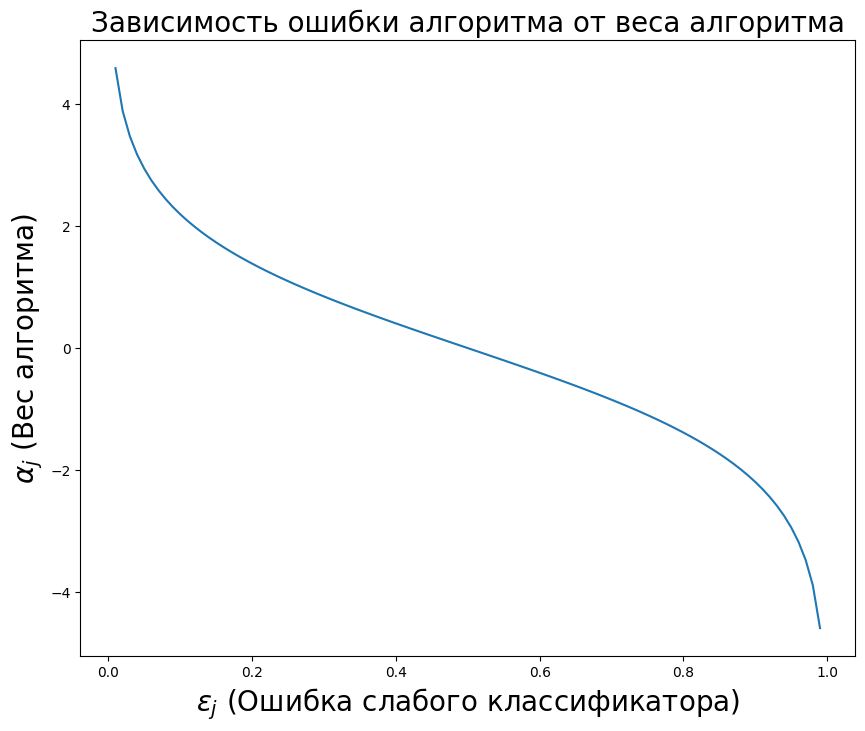

Небольшое число в знаменателе необходимо для того, чтобы не связываться с бесконечностями в процессе вычислений. (Случай самого идеального классификатора и самого ужасного)

## Новые веса примеров

После того, как обучили нового ученика, пора обновить веса. Какие требования:
1. Веса должны быть больше на примерах с ошибкой
2. Веса должны зависеть от вклада нового классификатора - $\alpha_j$
3. Веса должны быть отнормированы - сумма равна 1

$$w_i^{j+1} := w_i^{j} e^{-\alpha_j \mathbb{I}[y_j(x_i) \neq y_i]}$$

$$ w_i^{j+1} := \frac{w_i^{j+1}}{\sum_{i=1}^N w_i^{j+1}} $$

В знаменателе нормировка на сумму новых $w^j$, так, чтобы сумма была равна единице.

Новые веса тем выше, чем больше ошибка (с учетом веса). Обратное справедливо для верной классификации.


## Общий алгоритм


0. Инициализируем веса $w^0 = 1/N$
1. Обучаем слабый классификатор $y_j$ на взвешенной выборке
2. Вычисляем ошибку слабого классификатора $\varepsilon$
3. Вычисляем вес слабого классификатора $\alpha_j$
4. Обновляем веса $w^j$ элементов обучающей выборки
5. Повторяем пп. 1-5 $M$ раз

## Практика

Рассмотрим пример бинарной классификации на 2 класса $y_i = {1, -1}$. Тогда финальный прогноз М слабых классификаторов будет иметь вид:
$$Y(x) = sign (\sum_{j=1}^M \alpha_i y_j(x))$$

где
1. $sign$ возвращает 1, если аргумент положителен, и -1 в обратном случае
2. $\alpha_j$ - вес классификатора. Ответ классификаторов с отрицательным весом инвертируется.
3. $y_j(x)$ - прогноз алгоритма i (из М штук) на примере j (из n штук).

От голосования в случайном лесе отличается наличиев веса алгоритма $\alpha_j$.

### Один слабый классификатор

Ошибка для одного классификатора:
* $\epsilon_0 = \frac{num errors}{n}$
* $\epsilon_j = \sum_{missclaass} w_i$ или другими словами $\epsilon_j = \sum_i^n w_i^j I(y_j(x_i) \neq y_i)$, где $I(y_j(x_i) \neq y_i)$ - индикаторная функция, возвращающая 1 при ошибке классификации и 0 в обратном.

Если ошибка $0.5 \leq \epsilon_j$, то меняем прогноз на противоположный и $\epsilon_j = 1 - \epsilon_j$

---

Инициализация весов примеров:
* $w_0 = \frac{1}{n}$ для всех точек $i$
* $w_i^{j+1} = \frac{w_i^j exp(-\alpha_j I(y_j(x_i) \neq y_i))}{\sum_{i=1}^n w_i^{j+i}}$

---

Инициализация веса алгоритма:
$\alpha_j = ln\frac{1 - \epsilon_j}{\epsilon_j + 1e-5}$

1e-5 чтобы не поделить на ноль в случае нуля ошибок

Весь алгоритм выглядит так:
* Инициализировать веса $w_0$

Итерироваться $M$ раз (обучить $M$ слабых классификаторов):

1. Обучаем слабый классификатор y на взвешенной выборке
2. Вычисляем ошибку слабого классификатора
3. Вычисляем вес слабого классификатора
4. Обновляем веса $w$ элементов обучающей выборки

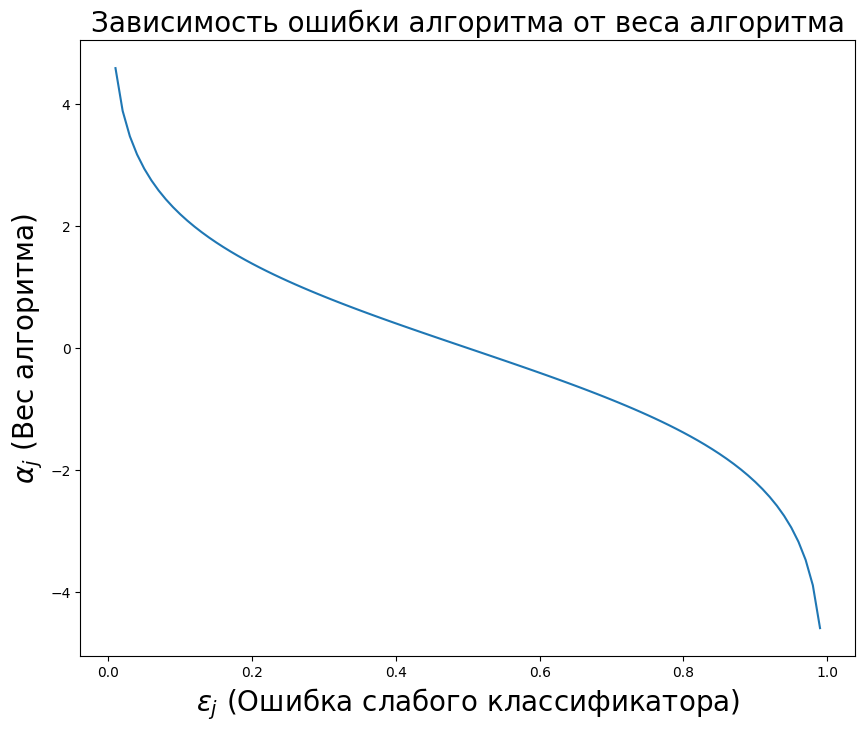

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

font = {'fontsize':20}

alpha = lambda x: np.log((1-x)/(x+1e-5))

error = np.arange(0.01, 1, 0.01)
plt.figure(figsize=(10, 8))
plt.title('Зависимость ошибки алгоритма от веса алгоритма', fontdict=font)
plt.xlabel(r'$\varepsilon_j$ (Ошибка слабого классификатора)', fontdict=font)
plt.ylabel(r'$\alpha_j$ (Вес алгоритма)', fontdict=font)
plt.plot(error, alpha(error))
plt.show()

### Реализация алгоритма

In [ ]:
# based on https://github.com/python-engineer/MLfromscratch/blob/master/mlfromscratch/adaboost.py

# решающий пень
class DecisionStump:
    # конструктор значений по умолчанию
    def __init__(self):
        self.polarity = 1 # +1 или -1 для заданного порога
        self.feature_idx = None # выбранный индекс
        self.threshold = None # пороговое значение
        self.alpha = None # качество алгоритма

    # X: np.array - обучающая выборка
    def predict(self, X):
        n_samples = X.shape[0] # количество элементов
        X_column = X[:, self.feature_idx] # выбранный на train признак, по которому энтропия самая большая
        preds = np.ones(n_samples) # для всех ответ 1
        if self.polarity == 1: # по умолчанию
            preds[X_column < self.threshold] = -1 # если меньше порога то -1
        else:
            preds[X_column > self.threshold] = -1 # если выше порога то -1
        return preds

# адабуст на пнях
class Adaboost:
    # конструктор значений по умолчанию
    # n_clf: int количество классификаторов
    def __init__(self, n_clf = 5):
        self.n_clf = n_clf
        self.clfs = []

    # функция обучения
    # X: np.array - обучающая выборка
    # y: np.array - вектор ответов
    def fit(self, X, y):
        n_samples, n_features = X.shape # количество примеров и признаков

        # инициализация весов
        w = np.full(n_samples, (1/n_samples))

        # проходимся по всем классификаторам
        self.clfs = []
        for _ in range(self.n_clf):
            clf = DecisionStump() # инициализируем слабый классификатор

            min_error = float('inf') # лучший результат по перебору всех порогов
            for feature_i in range(n_features):
                X_column = X[:, feature_i] # для признака i
                thresholds = np.unique(X_column) # все пороги
                for threshold in thresholds: # проходимся по всем порогам
                    p = 1 # +1 по умолчанию
                    predictions = np.ones(n_samples) # все прогнозы единицы
                    predictions[X_column < threshold] = -1 # если ниже порога - левый лист

                    missclassified = w[y != predictions] # количество ошибок
                    error = sum(missclassified) # суммарная ошибка

                    if error > 0.5: # если больше 0.5 - меняем прогноз на обратный
                        error = 1 - error
                        p = -1

                    if error < min_error: # меняем порог, если нашли результат лучше
                        clf.polarity = p # +1/-1
                        clf.threshold = threshold # лучший порог
                        clf.feature_idx = feature_i # выбранный признак
                        min_error = error # лучшая ошибка

            clf.alpha = np.log((1-min_error+1e-5) / (min_error + 1e-5)) # вес алгоритма в зависимости от ошибки
            preds = clf.predict(X) # предсказания алгоритмов
            w *= np.exp(-clf.alpha * predictions) # веса примеров
            w /= np.sum(w) # нормировка ошибки

            self.clfs.append(clf) # добавляем классификатор

    def predict(self, X):
        clf_preds = [clf.alpha * clf.predict(X) for clf in self.clfs] # умножаем вес алгоритма на его прогноз для всех классификаторов
        y_pred = np.sum(clf_preds, axis=0) # суммируем
        y_pred = np.sign(y_pred) # возвращаем +1 если положительно, -1 в обратном
        return y_pred

### Сравнение реализации с коробочным

In [ ]:
from sklearn import datasets
from sklearn.model_selection import train_test_split

data = datasets.load_breast_cancer() # стандартный датасет для рака груди
X = data.data # признаковое описание
y = data.target # ответы

y[y==0] = -1 # алгоритм требует разметки +- 1

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2)

In [ ]:
clf = Adaboost(n_clf=50) # проверим для 50 пней
clf.fit(X_train, y_train)
y_pred = clf.predict(X_test)

In [ ]:
from sklearn.metrics import classification_report
# метрики качества
print(classification_report(y_test, y_pred, target_names=data.target_names))

              precision    recall  f1-score   support

   malignant       0.93      0.85      0.89        46
      benign       0.90      0.96      0.93        68

    accuracy                           0.91       114
   macro avg       0.92      0.90      0.91       114
weighted avg       0.91      0.91      0.91       114



In [ ]:
# сравним с коробочным решением
from sklearn.ensemble import AdaBoostClassifier

y[y==-1] = 0
clf_sklearn = AdaBoostClassifier(n_estimators=50) # If None, then the base estimator is DecisionTreeClassifier initialized with max_depth=1.
clf_sklearn.fit(X_train, y_train)
y_pred_sklearn = clf_sklearn.predict(X_test)

In [ ]:
from sklearn.metrics import classification_report
# метрики качества
print(classification_report(y_test, y_pred_sklearn, target_names=data.target_names))

              precision    recall  f1-score   support

   malignant       0.98      0.96      0.97        46
      benign       0.97      0.99      0.98        68

    accuracy                           0.97       114
   macro avg       0.97      0.97      0.97       114
weighted avg       0.97      0.97      0.97       114



In [ ]:
from sklearn.linear_model import LogisticRegression

baseline = LogisticRegression()
baseline.fit(X_train, y_train)
y_pred_baseline = baseline.predict(X_test)

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_logistic.py:465: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. OF ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


In [ ]:
from sklearn.metrics import classification_report
# метрики качества
print(classification_report(y_test, y_pred_baseline, target_names=data.target_names))

              precision    recall  f1-score   support

   malignant       0.98      0.96      0.97        46
      benign       0.97      0.99      0.98        68

    accuracy                           0.97       114
   macro avg       0.97      0.97      0.97       114
weighted avg       0.97      0.97      0.97       114



## Плюсы и минусы

**Плюсы:**
- легкая имплементация
- работает с любыми моделями для слабых учеников (кроме линейных моделей для регрессии!) - лучше использовать high bias - low variance модели, например, решающие пни

**Минусы:**
- алгоритм доказывается эмпирически - нет строгого обоснования
- слабые классификаторы в случае, если они слишком слабые, могут привести к плохим результатам и переобучению


Нужен более обоснованный и качественный метод...

# Градиентный бустинг

Пусть $L$ - дифференцируемая функция потерь, наш алгоритм $a(x)$ представляет собой композицию базовых алгоритмов:

$$a(x) = a_k(x) = \sum_{i=0}^k b_i(x)$$

Будем считать, что каждый базовый алгоритм является параметрическим и представим в виде:

$$ b_i(x) = \rho_i \cdot h(x, \theta_i) $$

Пусть на данный момент построено $t-1$ базовых алгоритмов, хотим построить $t$-й:

$$\hat{a}(x) = \sum_{i=0}^{t-1} b_i(x)$$

Новый алгоритм находим из условия:

$$(\rho_t, \theta_t) = \arg\min\limits_{\rho, \theta} \big( \frac{1}{N} \sum_{i=1}^N L(y_i, \hat{a}(x_i) + \rho \cdot h(x_i, \theta) \big) $$

$$b_t(x) = \rho_t \cdot h(x, \theta_t)$$

Все функции дифференцируемы, давайте искать минимум с помощью градиентного спуска **в пространстве наших моделей**!

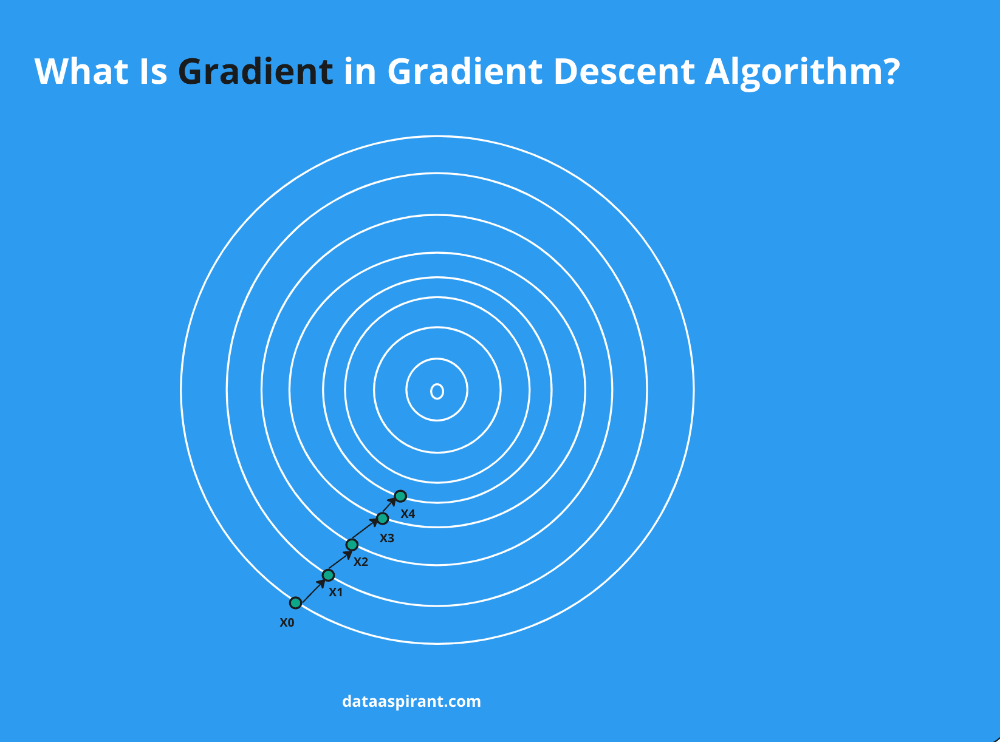

В таком случае, наша новая модель должна быть направлена в сторону антиградиента (чтобы минимизировать лосс):

$$ r_{it} = - \Big[ \frac{\partial L(y_i, a(x_i))}{\partial a(x_i)}\Big]_{a(x)=\hat{a}(x)}, \quad \forall i $$

$$ \theta_t = \arg\min\limits_\theta \frac{1}{N} \sum_{i=1}^N (r_{it} - h(x_i, \theta))^2 $$

$$ \rho_t = \arg\min\limits_\rho \frac{1}{N} \sum_{i=1}^N L(y_i, \hat{a}(x_i) + \rho \cdot h(x_i, \theta_t)) $$

>**Проще говоря**
>
>- В классическом градиентном спуске мы меняем параметры модели так, чтобы лосс стал меньше - с помощью learning rate и антиградиента
>- В градиентном бустинге мы подбираем параметры новой модели так, чтобы ее предсказания равнялись антиградиенту, а ее вес в ансамбле стал - эквивалент learning rate, чтобы в итоге лосс стал меньше

И так делаем на каждом шаге! Остается вопрос - что брать в качестве $b_0$?

Хорошие результаты получаются даже с $b_0=const$ (например, что-то среднее - самый частый класс, среднее значение для регрессии)

> **Важное замечание**
>
> Мы требуем дифференцируемости только функции потерь $L$!
>
> Сами модели слабых учеников могут быть недифференцируемы! Главное - чтобы могли обучаться предсказывать антиградиент функции потерь, а как именно  - не важно!

### Пример работы

Слева - весь ансамбль, справа - отдельное новое дерево на каждом этапе

![](https://habrastorage.org/r/w1560/web/edb/328/98a/edb32898ad014d8d95782759d11f63fb.png)

## Практические моменты

### FAQ

> **Почему не стоит использовать глубокие деревья для ансамбля типа бустинг?**
>
> Потому что глубокое дерево склонно к переобучению, значит у него ошибки будут маленькие, значит маленький градиент функции ошибки, значит нет смысла в градиентном бустинге.
>
> GBM хорошо переобучается, можем сделать настолько большой ансамбль, что подгонимся под обучающую выборку, поэтому лучше использовать простые алгоритмы

> **Можно ли делать градиентный бустинг над линейными моделями?**
>
>В задаче регрессии - нет, потому что получим линейную комбинацию линейных моделей, что является линейной моделью. В задаче классификации - да, потому что у нас есть нелинейность в виде сигмоиды, в результате имеем линейную комбинацию **нелинейных** моделей, а это уже дает выигрыш.

> **Можно ли распараллелить бустинг?**
>
>Можно, но на уровне отдельного дерева.


> **Задача регрессии. В обучающей выборке только положительные целевые метки. Можем ли на тесте получить отрицательные?**
>
> В случайном лесу - нет, т.к. имеем сумму деревьев. В бустинге - можем, т.к. можем предсказывать на уровне отдельного дерева и отрицательные элементы

Типичный градиентный бустинг - несколько тысяч деревьев решений, которые необходимо строить **последовательно**.

Построение решающего дерева требует небольшого, но всё-таки заметного времени (0.1-1c), для всего ансамбля - десятки минут.

Это не так быстро, как обучение линейных моделей, но всё-таки значительно быстрее, чем обучение типичных нейросетей.

### Реализации

Для общего развития имеет смысл посмотреть реализацию в [sklearn](https://scikit-learn.org/stable/modules/generated/sklearn.ensemble.GradientBoostingClassifier.html), но на практике она весьма медленная и не такая уж умная.

Хороших реализаций GBDT есть, как минимум, три:
- [LightGBM](https://lightgbm.readthedocs.io/en/latest/)
- [XGBoost](https://xgboost.readthedocs.io/en/latest/)
- [CatBoost](https://catboost.ai/)

Исторически они отличались довольно сильно, но за последние годы успели скопировать друг у друга все хорошие идеи.

### Где используется

Везде :) На сегодня градиентный бустинг – это, фактически, один из двух подходов, которые используются на практике (второй – это нейронные сети, конечно). Он формально слабее и менее гибок, чем сети, но выигрывает в простоте настройки темпа обучения и применения, размере и интерпретируемости модели.

Во многих компаниях, так или иначе связанных с ML, он используется для всех задач, которые не связаны с однородными данными (картинками, текстами, etc). Типичный поисковый запрос в Яндексе, выбор отеля на Booking.com или сериала на вечер в Netflix задействует несколько десятков моделей GBDT.

Впрочем, в будущем можно ожидать плавного исчезновения этого подхода, так как улучшение архитектур глубинного обучения и дальнейшее развитие железа нивелирует его преимущество по сравнению с нейросетями.

## Демо

Отличная визуализация - https://arogozhnikov.github.io/2016/06/24/gradient_boosting_explained.html

## Практика

Имеется набор данных ${(x_i, y_i)}_{i = 1, \cdots , n}$ с дифференцируемой функцией потерь $L(y, f)$

Определим оптимальную модель как:

$$\hat{f}(x) = argmin_{f(x)} L(y, f(x)) = argmin_{f(x)} E_{x, y}[L(y, f(x))]$$

У модели есть параметры, которые мы оптимизируем ($\theta$). Говорим, что модель принадлежит некоторому параметрическому семейству $\hat{f}(x) = f(x, \theta)$

$$\theta = argmin_\theta E_{x, y}[L(t, f(x, \theta))]$$

Будем нашу модель ансамблевыми моделями:

$$\hat{f}(x) = \sum_{i=0}^{t-1}\hat{f_i}(x)$$

Т.е. каждая модель исправляет предыдущую.

Будем считать, что она минимизирует ошибку всего предыдущего ансамбля:

$$(\rho, \theta_t) = argmin_{\rho, \theta_t} E_{x, y}[L(y, \hat{f}(x) + \rho h(x, \theta))]$$

Где новая (минимизирующая ошибку ансамбля модель) $\hat{f}_t(x) = \rho_t h(x, \theta_t)$

Пусть прогноз всего ансамбля $\hat{y_i} = f_t(x_i)$, тогда градиент для точки $x_i$ будет равен $\frac{\partial L}{\partial \hat{y_i}}$.

Возьмем наиболее распространенную функция потерь $MSE$ для задачи регрессии. Тогда для нее градиент
$$\frac{\partial L}{\partial \hat{y_i}} = \frac{\partial (y_i - \hat{y_i})^2}{\partial \hat{y_i}} = -2 (y_i - \hat{y_i})$$

Тогда выражения прогноза для всех точек i для произвольной производной функции потерь имеет вид:

$$r_{it} = \[
    \frac{\partial L (y_i, f(x_i))}{\partial f(x_i)}
    \]_{f(x) = \hat{f}(x)}$$ для $i = 1, \cdots, n$.

Тогда оптимальный вектор параметров новой модели:

$$\theta_t = argmin_{\theta}\sum_i^n (r_{it} - h(x_i, \theta))^2$$

Т.е. минимизируется среднеквадратичное отклонение между значением минус градиента (ф-ии ошибки) и предсказаниями модели (с прошлого шага)

$$\rho_t = argmin_\rho \sum_i^n L(y_i, \hat{f}(x_i) + \rho h(x_i, \theta))$$

Продифференцировав по $\rho$ оригинальную функцию потерь $L$ добавляем новую модель в ансамбль.


В качестве изначального значения для построения моделей часто берут константу. Например, для MSE этр будет среднее значение т.к. для одной точки это

$$\frac{\partial L}{\partial \hat{y_i}} = \frac{\partial (y_i - \hat{y_i})^2}{\partial \hat{y_i}} = -2 (y_i - \hat{y_i})$$

Приравнивая минус градиент к нулю для всех точек получаем:

$$\frac{\partial L}{\partial \hat{y}} = 0$$

$-2 (y - \hat{y}) = 0$, откуда $\hat{y} = y$ т.к. нам нужно одно значение, а не вектор, то получаем, что нужно усреднить $y$.

### Данные

Анализ набора данных маркетинговых кампаний банков

https://www.kaggle.com/volodymyrgavrysh/bank-marketing-campaigns-dataset

Это набор данных, описывающий результаты маркетинговых кампаний португальских банков. Проведенные кампании были основаны в основном на прямых телефонных звонках, предлагающих клиенту банка разместить срочный депозит. Если после всех маркетинговых мероприятий клиент соглашался разместить депозит - целевая переменная отмечалась как "да", в противном случае - "нет".

In [ ]:
!gdown 14z5H8l3Qm-kY7_2UEQFg-DH0lgEcpc0k

Downloading...
From: https://drive.google.com/uc?id=14z5H8l3Qm-kY7_2UEQFg-DH0lgEcpc0k
To: /content/bank-additional-full.csv
100% 5.83M/5.83M [00:00<00:00, 39.8MB/s]


In [ ]:
import pandas as pd

df = pd.read_csv('/content/bank-additional-full.csv', sep=';')
df

,age,job,marital,education,default,housing,loan,contact,month,day_of_week,...,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,y
0,56,housemaid,married,basic.4y,no,no,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
1,57,services,married,high.school,unknown,no,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
2,37,services,married,high.school,no,yes,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
3,40,admin.,married,basic.6y,no,no,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
4,56,services,married,high.school,no,no,yes,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
41183,73,retired,married,professional.course,no,yes,no,cellular,nov,fri,...,1,999,0,nonexistent,-1.1,94.767,-50.8,1.028,4963.6,yes
41184,46,blue-collar,married,professional.course,no,no,no,cellular,nov,fri,...,1,999,0,nonexistent,-1.1,94.767,-50.8,1.028,4963.6,no
41185,56,retired,married,university.degree,no,yes,no,cellular,nov,fri,...,2,999,0,nonexistent,-1.1,94.767,-50.8,1.028,4963.6,no
41186,44,technician,married,professional.course,no,no,no,cellular,nov,fri,...,1,999,0,nonexistent,-1.1,94.767,-50.8,1.028,4963.6,yes


<Axes: >

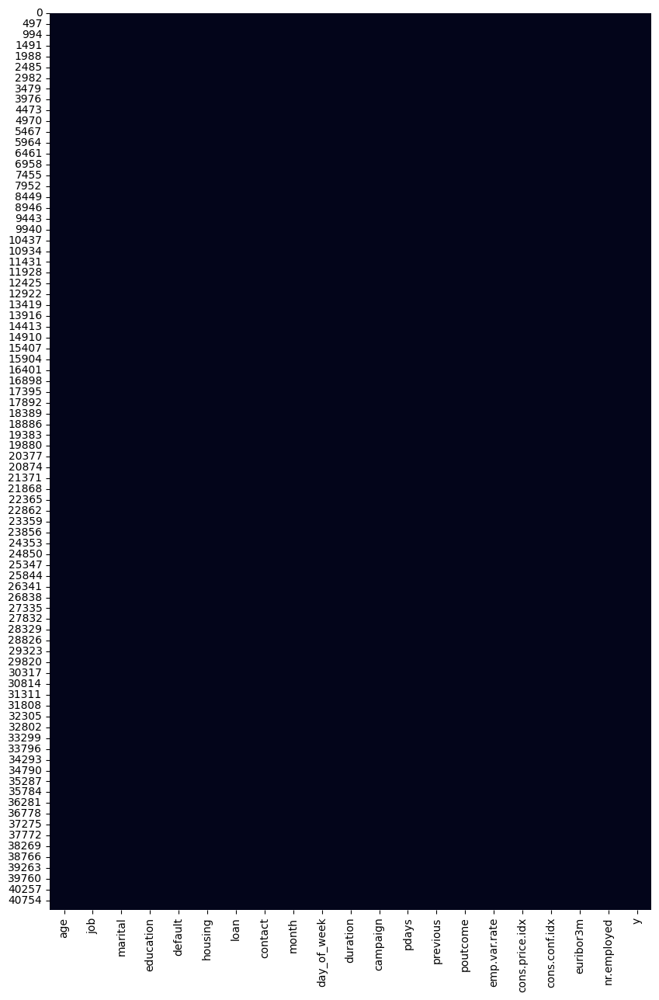

In [ ]:
import seaborn as sns
from matplotlib.pyplot import figure
import numpy as np

figure(figsize = (10, 15))
sns.heatmap(df.isnull(), cbar=False)

<Axes: >

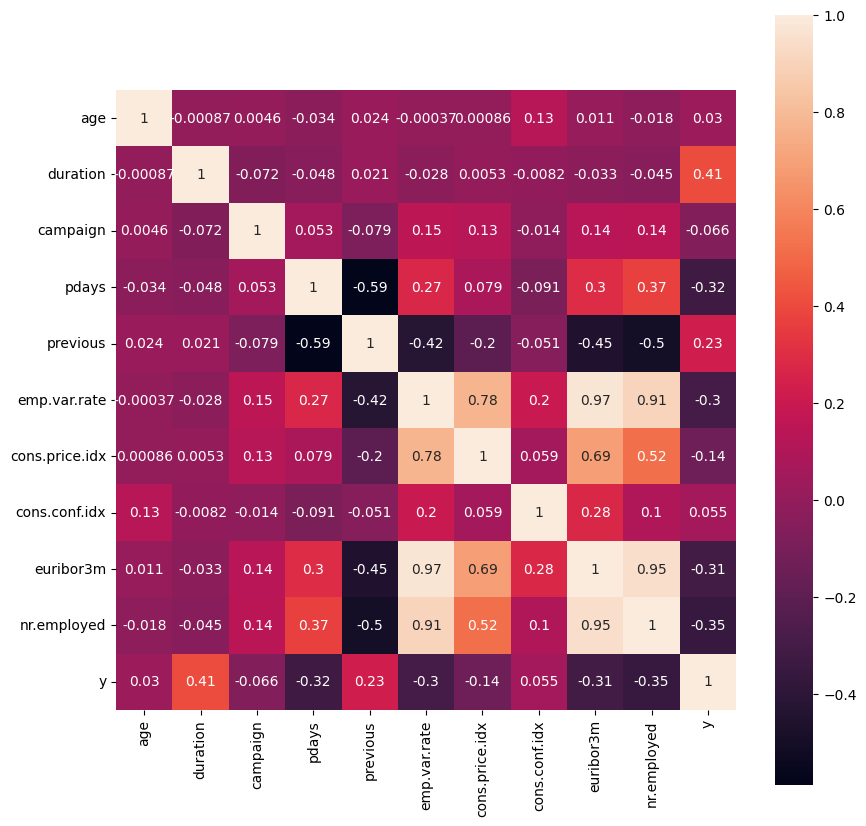

In [ ]:
import seaborn as sns
from matplotlib.pyplot import figure

df['y'] = df['y'].map({'yes':1, 'no':0})

figure(figsize = (10, 10))
sns.heatmap(df.select_dtypes(include=np.number).corr(), annot=True, square=True, )

In [ ]:
df

,age,job,marital,education,default,housing,loan,contact,month,day_of_week,...,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,y
0,56,housemaid,married,basic.4y,no,no,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,0
1,57,services,married,high.school,unknown,no,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,0
2,37,services,married,high.school,no,yes,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,0
3,40,admin.,married,basic.6y,no,no,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,0
4,56,services,married,high.school,no,no,yes,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
41183,73,retired,married,professional.course,no,yes,no,cellular,nov,fri,...,1,999,0,nonexistent,-1.1,94.767,-50.8,1.028,4963.6,1
41184,46,blue-collar,married,professional.course,no,no,no,cellular,nov,fri,...,1,999,0,nonexistent,-1.1,94.767,-50.8,1.028,4963.6,0
41185,56,retired,married,university.degree,no,yes,no,cellular,nov,fri,...,2,999,0,nonexistent,-1.1,94.767,-50.8,1.028,4963.6,0
41186,44,technician,married,professional.course,no,no,no,cellular,nov,fri,...,1,999,0,nonexistent,-1.1,94.767,-50.8,1.028,4963.6,1


array([[<Axes: title={'center': 'age'}>,
        <Axes: title={'center': 'duration'}>,
        <Axes: title={'center': 'campaign'}>],
       [<Axes: title={'center': 'pdays'}>,
        <Axes: title={'center': 'previous'}>,
        <Axes: title={'center': 'emp.var.rate'}>],
       [<Axes: title={'center': 'cons.price.idx'}>,
        <Axes: title={'center': 'cons.conf.idx'}>,
        <Axes: title={'center': 'euribor3m'}>],
       [<Axes: title={'center': 'nr.employed'}>,
        <Axes: title={'center': 'y'}>, <Axes: >]], dtype=object)

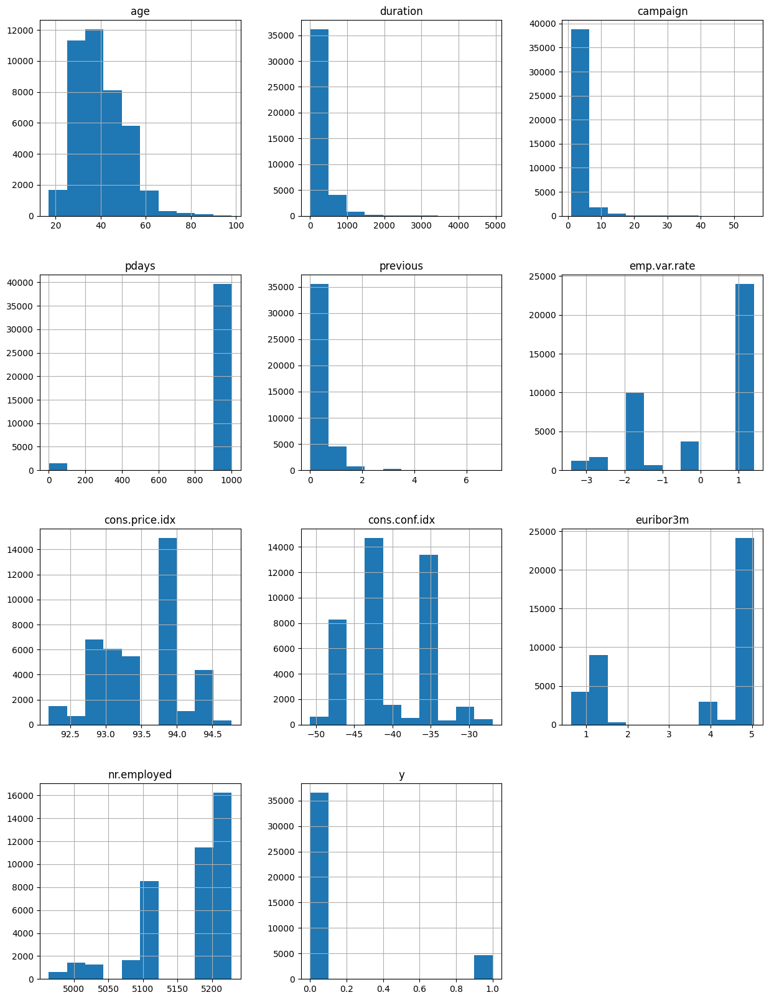

In [ ]:
df.hist(figsize=(15, 20))

In [ ]:
del df['duration'] # нам заранее не известно как долго клиент будет говорить по телефону

In [ ]:
df['y'].value_counts()

,count
y,
0,36548
1,4640


In [ ]:
categor = df.select_dtypes(exclude=np.number) # найдем категориальные
categor

,job,marital,education,default,housing,loan,contact,month,day_of_week,poutcome
0,housemaid,married,basic.4y,no,no,no,telephone,may,mon,nonexistent
1,services,married,high.school,unknown,no,no,telephone,may,mon,nonexistent
2,services,married,high.school,no,yes,no,telephone,may,mon,nonexistent
3,admin.,married,basic.6y,no,no,no,telephone,may,mon,nonexistent
4,services,married,high.school,no,no,yes,telephone,may,mon,nonexistent
...,...,...,...,...,...,...,...,...,...,...
41183,retired,married,professional.course,no,yes,no,cellular,nov,fri,nonexistent
41184,blue-collar,married,professional.course,no,no,no,cellular,nov,fri,nonexistent
41185,retired,married,university.degree,no,yes,no,cellular,nov,fri,nonexistent
41186,technician,married,professional.course,no,no,no,cellular,nov,fri,nonexistent


In [ ]:
numeric = df.select_dtypes(include=np.number)
numeric

,age,campaign,pdays,previous,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,y
0,56,1,999,0,1.1,93.994,-36.4,4.857,5191.0,0
1,57,1,999,0,1.1,93.994,-36.4,4.857,5191.0,0
2,37,1,999,0,1.1,93.994,-36.4,4.857,5191.0,0
3,40,1,999,0,1.1,93.994,-36.4,4.857,5191.0,0
4,56,1,999,0,1.1,93.994,-36.4,4.857,5191.0,0
...,...,...,...,...,...,...,...,...,...,...
41183,73,1,999,0,-1.1,94.767,-50.8,1.028,4963.6,1
41184,46,1,999,0,-1.1,94.767,-50.8,1.028,4963.6,0
41185,56,2,999,0,-1.1,94.767,-50.8,1.028,4963.6,0
41186,44,1,999,0,-1.1,94.767,-50.8,1.028,4963.6,1


In [ ]:
from sklearn.preprocessing import OneHotEncoder

# в случае, если появляется неизвестных новых - игнорируем
enc = OneHotEncoder(handle_unknown='ignore')
# выбираем какие на основе каких признаков производить преобразования
enc.fit(categor)
# производим преобразования категориальных
codes = enc.transform(categor).toarray()
# выделим названия категориальных колонок из тех, на основе которых преобразуем
feature_names = enc.get_feature_names_out(categor.columns)
# объединяем числовые и категориальные колонки

data_onehot = pd.concat([numeric, # исключаем категориальные = выбираем цифровые
                        pd.DataFrame(codes,columns=feature_names)], axis = 1) # выбираем закодированные

In [ ]:
data_onehot

,age,campaign,pdays,previous,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,y,...,month_oct,month_sep,day_of_week_fri,day_of_week_mon,day_of_week_thu,day_of_week_tue,day_of_week_wed,poutcome_failure,poutcome_nonexistent,poutcome_success
0,56,1,999,0,1.1,93.994,-36.4,4.857,5191.0,0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0
1,57,1,999,0,1.1,93.994,-36.4,4.857,5191.0,0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0
2,37,1,999,0,1.1,93.994,-36.4,4.857,5191.0,0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0
3,40,1,999,0,1.1,93.994,-36.4,4.857,5191.0,0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0
4,56,1,999,0,1.1,93.994,-36.4,4.857,5191.0,0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
41183,73,1,999,0,-1.1,94.767,-50.8,1.028,4963.6,1,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
41184,46,1,999,0,-1.1,94.767,-50.8,1.028,4963.6,0,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
41185,56,2,999,0,-1.1,94.767,-50.8,1.028,4963.6,0,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
41186,44,1,999,0,-1.1,94.767,-50.8,1.028,4963.6,1,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0


In [ ]:
# Подключаем класс для предобработки данных
from sklearn import preprocessing

# Напишем функцию, которая принимает на вход DataFrame, кодирует числовыми значениями категориальные признаки
# и возвращает обновленный DataFrame и сами кодировщики.
def number_encode_features(init_df):
    result = init_df.copy() # копируем нашу исходную таблицу
    encoders = {}
    for column in result.columns:
        if result.dtypes[column] == object: # np.object -- строковый тип / если тип столбца - строка, то нужно его закодировать
            print(column)
            encoders[column] = preprocessing.LabelEncoder() # для колонки column создаем кодировщик
            result[column] = encoders[column].fit_transform(result[column]) # применяем кодировщик к столбцу и перезаписываем столбец
    return result, encoders

# используем все, кроме описания
encoded_data, encoders = number_encode_features(df) # Теперь encoded data содержит закодированные кат. признаки

job
marital
education
default
housing
loan
contact
month
day_of_week
poutcome


In [ ]:
X = encoded_data.drop(columns=['y'])
y = encoded_data['y']

X.shape, y.shape

((41188, 19), (41188,))

In [ ]:
X = data_onehot.drop(columns=['y'])
y = data_onehot['y']

X.shape, y.shape

((41188, 62), (41188,))

In [ ]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, stratify = y)

X_train.shape, X_test.shape, y_train.shape, y_test.shape

((32950, 62), (8238, 62), (32950,), (8238,))

### Модели

#### Лес

In [ ]:
from sklearn.ensemble import RandomForestClassifier

In [ ]:
rf = RandomForestClassifier(n_estimators=500)
rf.fit(X_train, y_train)

RandomForestClassifier(n_estimators=500)

In [ ]:
from sklearn.metrics import classification_report

print(classification_report(y_test, rf.predict(X_test)))

              precision    recall  f1-score   support

           0       0.91      0.97      0.94      7310
           1       0.53      0.27      0.36       928

    accuracy                           0.89      8238
   macro avg       0.72      0.62      0.65      8238
weighted avg       0.87      0.89      0.87      8238



#### Аугментации

In [ ]:
from imblearn.over_sampling import ADASYN

augm = ADASYN()
X_train_augm, y_train_augm = augm.fit_resample(np.array(X_train), np.array(y_train))

In [ ]:
rf = RandomForestClassifier()
rf.fit(X_train_augm, y_train_augm)

RandomForestClassifier()

In [ ]:
from sklearn.metrics import classification_report

print(classification_report(y_test, rf.predict(X_test)))

              precision    recall  f1-score   support

           0       0.92      0.96      0.94      7310
           1       0.52      0.30      0.38       928

    accuracy                           0.89      8238
   macro avg       0.72      0.63      0.66      8238
weighted avg       0.87      0.89      0.88      8238



/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2732: UserWarning: X has feature names, but RandomForestClassifier was fitted without feature names
  warnings.warn(


In [ ]:
from imblearn.under_sampling import TomekLinks

augm = TomekLinks(sampling_strategy='majority')
X_train_augm, y_train_augm = augm.fit_resample(np.array(X_train), np.array(y_train))

In [ ]:
rf = RandomForestClassifier()
rf.fit(X_train_augm, y_train_augm)

RandomForestClassifier()

In [ ]:
from sklearn.metrics import classification_report

print(classification_report(y_test, rf.predict(X_test)))

              precision    recall  f1-score   support

           0       0.92      0.96      0.94      7310
           1       0.52      0.33      0.40       928

    accuracy                           0.89      8238
   macro avg       0.72      0.65      0.67      8238
weighted avg       0.87      0.89      0.88      8238



/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2732: UserWarning: X has feature names, but RandomForestClassifier was fitted without feature names
  warnings.warn(


#### Логистическая

In [ ]:
from sklearn.linear_model import LogisticRegression

lr = LogisticRegression(class_weight = 'balanced')
lr.fit(X_train_augm, y_train_augm)

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_logistic.py:465: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. OF ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


LogisticRegression(class_weight='balanced')

In [ ]:
print(classification_report(y_test, lr.predict(X_test)))

              precision    recall  f1-score   support

           0       0.95      0.77      0.85      7310
           1       0.27      0.68      0.38       928

    accuracy                           0.76      8238
   macro avg       0.61      0.72      0.62      8238
weighted avg       0.87      0.76      0.80      8238



/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2732: UserWarning: X has feature names, but LogisticRegression was fitted without feature names
  warnings.warn(


In [ ]:
lr = LogisticRegression()
lr.fit(X_train_augm, y_train_augm)

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_logistic.py:465: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. OF ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


LogisticRegression()

In [ ]:
print(classification_report(y_test, lr.predict(X_test)))

              precision    recall  f1-score   support

           0       0.91      0.99      0.95      7310
           1       0.66      0.21      0.32       928

    accuracy                           0.90      8238
   macro avg       0.78      0.60      0.63      8238
weighted avg       0.88      0.90      0.88      8238



/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2732: UserWarning: X has feature names, but LogisticRegression was fitted without feature names
  warnings.warn(


In [ ]:
from imblearn.under_sampling import TomekLinks

TomekLinks

imblearn.under_sampling._prototype_selection._tomek_links.TomekLinks

In [ ]:
from sklearn.neural_network import MLPClassifier

clf = MLPClassifier(solver='lbfgs', alpha=1e-5,
                    hidden_layer_sizes=(5, 2), random_state=1)

clf.fit(X_train, y_train)

MLPClassifier(alpha=1e-05, hidden_layer_sizes=(5, 2), random_state=1,
              solver='lbfgs')

In [ ]:
print(classification_report(y_test, clf.predict(X_test)))

              precision    recall  f1-score   support

           0       0.89      1.00      0.94      7310
           1       0.00      0.00      0.00       928

    accuracy                           0.89      8238
   macro avg       0.44      0.50      0.47      8238
weighted avg       0.79      0.89      0.83      8238



/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


In [ ]:
from sklearn.datasets import make_classification
from sklearn.svm import SVC
from sklearn.model_selection import GridSearchCV
import pandas as pd

In [ ]:
from imblearn.ensemble import BalancedRandomForestClassifier

clf = BalancedRandomForestClassifier()

clf.fit(X_train, y_train)

BalancedRandomForestClassifier()

In [ ]:
print(classification_report(y_test, clf.predict(X_test)))

              precision    recall  f1-score   support

           0       0.95      0.87      0.91      7310
           1       0.37      0.61      0.46       928

    accuracy                           0.84      8238
   macro avg       0.66      0.74      0.68      8238
weighted avg       0.88      0.84      0.86      8238



#### Градиентный бустинг

In [ ]:
import xgboost as xgb

param_dist = {'objective':'binary:logistic', 'n_estimators':50, 'eval_metric': 'logloss'}

clf = xgb.XGBClassifier(**param_dist)

clf.fit(X_train, y_train,
    eval_set=[(X_test, y_test)],
    verbose=True,
    # sample_weight=[0.1, 0.9]
)

evals_result = clf.evals_result()

[0]	validation_0-logloss:0.32294
[1]	validation_0-logloss:0.30267
[2]	validation_0-logloss:0.29125
[3]	validation_0-logloss:0.28444
[4]	validation_0-logloss:0.28014
[5]	validation_0-logloss:0.27737
[6]	validation_0-logloss:0.27612
[7]	validation_0-logloss:0.27539
[8]	validation_0-logloss:0.27439
[9]	validation_0-logloss:0.27399
[10]	validation_0-logloss:0.27383
[11]	validation_0-logloss:0.27392
[12]	validation_0-logloss:0.27412
[13]	validation_0-logloss:0.27403
[14]	validation_0-logloss:0.27417
[15]	validation_0-logloss:0.27437
[16]	validation_0-logloss:0.27427
[17]	validation_0-logloss:0.27421
[18]	validation_0-logloss:0.27435
[19]	validation_0-logloss:0.27455
[20]	validation_0-logloss:0.27453
[21]	validation_0-logloss:0.27466
[22]	validation_0-logloss:0.27463
[23]	validation_0-logloss:0.27439
[24]	validation_0-logloss:0.27446
[25]	validation_0-logloss:0.27454
[26]	validation_0-logloss:0.27448
[27]	validation_0-logloss:0.27449
[28]	validation_0-logloss:0.27470
[29]	validation_0-loglos

In [ ]:
xgb.XGBClassifier

xgboost.sklearn.XGBClassifier

In [ ]:
print(classification_report(y_test, clf.predict(X_test.values)))

              precision    recall  f1-score   support

           0       0.91      0.98      0.94      7310
           1       0.62      0.25      0.36       928

    accuracy                           0.90      8238
   macro avg       0.76      0.62      0.65      8238
weighted avg       0.88      0.90      0.88      8238



In [ ]:
!pip install catboost

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 99.2/99.2 MB 9.7 MB/s eta 0:00:00


In [ ]:
!nvidia-smi

Mon May 26 12:06:19 2025       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 550.54.15              Driver Version: 550.54.15      CUDA Version: 12.4     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  Tesla T4                       Off |   00000000:00:04.0 Off |                    0 |
| N/A   41C    P0             26W /   70W |     102MiB /  15360MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

In [ ]:
from catboost import CatBoostClassifier

model = CatBoostClassifier(iterations=1000,
                           task_type="GPU",
                           devices='0:1',
                        use_best_model=True,)

model.fit(X_train, y_train, verbose=True, eval_set=[(X_test, y_test)])

Learning rate set to 0.052906
0:	learn: 0.6380157	test: 0.6382553	best: 0.6382553 (0)	total: 291ms	remaining: 4m 51s
1:	learn: 0.5899730	test: 0.5904540	best: 0.5904540 (1)	total: 514ms	remaining: 4m 16s
2:	learn: 0.5489317	test: 0.5496863	best: 0.5496863 (2)	total: 818ms	remaining: 4m 31s
3:	learn: 0.5141639	test: 0.5151214	best: 0.5151214 (3)	total: 1.16s	remaining: 4m 49s
4:	learn: 0.4826960	test: 0.4839717	best: 0.4839717 (4)	total: 1.39s	remaining: 4m 37s
5:	learn: 0.4572702	test: 0.4588439	best: 0.4588439 (5)	total: 1.6s	remaining: 4m 25s
6:	learn: 0.4337302	test: 0.4354802	best: 0.4354802 (6)	total: 1.72s	remaining: 4m 3s
7:	learn: 0.4137053	test: 0.4158021	best: 0.4158021 (7)	total: 1.79s	remaining: 3m 42s
8:	learn: 0.3972602	test: 0.3996428	best: 0.3996428 (8)	total: 1.86s	remaining: 3m 24s
9:	learn: 0.3823925	test: 0.3850285	best: 0.3850285 (9)	total: 1.91s	remaining: 3m 8s
10:	learn: 0.3686873	test: 0.3715009	best: 0.3715009 (10)	total: 1.97s	remaining: 2m 57s
11:	learn: 0.3

In [ ]:
preds = model.predict(X_test)

In [ ]:
print(classification_report(y_test, preds))

              precision    recall  f1-score   support

           0       0.91      0.98      0.95      7310
           1       0.66      0.24      0.35       928

    accuracy                           0.90      8238
   macro avg       0.79      0.61      0.65      8238
weighted avg       0.88      0.90      0.88      8238



In [ ]:
%load_ext tensorboard

In [ ]:
!mkdir models

In [ ]:
%tensorboard --logdir '/content/models/'

import os

for learning_rate in [0.001, 0.003, 0.03]:
    for depth in [4, 10, 12, 16]:
        for l2_leaf_reg in [3, 8, 15]:
            model_name = f'lr={learning_rate}|depth={depth}|l2_leaf_reg={l2_leaf_reg}'
            train_dir = '/content/models/' + model_name + '/'

            try:
                os.mkdir(train_dir)
            except:
                pass


            model = CatBoostClassifier(iterations=1500,
                                    task_type="GPU",
                                    devices='0:1',
                                    learning_rate = learning_rate,
                                    train_dir=train_dir,
                                    depth=depth,
                                    l2_leaf_reg=l2_leaf_reg)

            model.fit(X_train, y_train,
                      silent=True,
                      eval_set = (X_test, y_test),
                      early_stopping_rounds = 400)

            model.save_model(train_dir + model_name + '.cbm')

<IPython.core.display.Javascript object>

KeyboardInterrupt: 

In [ ]:
model = CatBoostClassifier()
model.load_model("models/lr=0.001|depth=4|l2_leaf_reg=8/lr=0.001|depth=4|l2_leaf_reg=8.cbm")

In [ ]:
train_dataset = Pool(X_train,
                     y_train,
                     weight=y_train.apply(lambda x: 7310./8238. if x == 1 else 928./8238.).values)

In [ ]:
preds = model.predict(X_test)
print(classification_report(y_test, preds))

              precision    recall  f1-score   support

           0       0.95      0.87      0.91      7310
           1       0.38      0.63      0.48       928

    accuracy                           0.84      8238
   macro avg       0.67      0.75      0.69      8238
weighted avg       0.89      0.84      0.86      8238

